# GANomaly
- 2020.08.16 : gen 15 / lr 1e-2

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-2

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 15)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3915 / DC_loss : 0.4173
- D(x):0.4996 / D(DC(z1)) : 0.5021 / D(DC(z2)) : 0.6589
[1/100][1/21]
- D_loss : 1.9919 / DC_loss : 0.4225
- D(x):0.3746 / D(DC(z1)) : 0.6192 / D(DC(z2)) : 0.6555
[1/100][2/21]
- D_loss : 1.9333 / DC_loss : 0.7773
- D(x):0.4324 / D(DC(z1)) : 0.6615 / D(DC(z2)) : 0.4597
[1/100][3/21]
- D_loss : 1.7831 / DC_loss : 0.5453
- D(x):0.3120 / D(DC(z1)) : 0.4596 / D(DC(z2)) : 0.5797
[1/100][4/21]
- D_loss : 1.4698 / DC_loss : 0.5753
- D(x):0.5472 / D(DC(z1)) : 0.5796 / D(DC(z2)) : 0.5625
[1/100][5/21]
- D_loss : 1.4622 / DC_loss : 0.7808
- D(x):0.5298 / D(DC(z1)) : 0.5625 / D(DC(z2)) : 0.4580
[1/100][6/21]
- D_loss : 1.4064 / DC_loss : 0.7274
- D(x):0.4522 / D(DC(z1)) : 0.4581 / D(DC(z2)) : 0.4832
[1/100][7/21]
- D_loss : 1.4059 / DC_loss : 0.6357
- D(x):0.4745 / D(DC(z1)) : 0.4832 / D(DC(z2)) : 0.5296
[1/100][8/21]
- D_loss : 1.4080 / DC_loss : 0.6465
- D(x):0.5032 / D(DC(z1)) : 0.5136 / D(DC(z2)) : 0.5239
[1/100][9/21]
- D_loss : 1.4259 / DC_

[4/100][14/21]
- D_loss : 1.3866 / DC_loss : 0.6946
- D(x):0.5014 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.4993
[4/100][15/21]
- D_loss : 1.3863 / DC_loss : 0.6915
- D(x):0.4990 / D(DC(z1)) : 0.4991 / D(DC(z2)) : 0.5008
[4/100][16/21]
- D_loss : 1.3867 / DC_loss : 0.6956
- D(x):0.5005 / D(DC(z1)) : 0.5007 / D(DC(z2)) : 0.4988
[4/100][17/21]
- D_loss : 1.3866 / DC_loss : 0.6881
- D(x):0.4985 / D(DC(z1)) : 0.4987 / D(DC(z2)) : 0.5025
[4/100][18/21]
- D_loss : 1.3866 / DC_loss : 0.6910
- D(x):0.5023 / D(DC(z1)) : 0.5025 / D(DC(z2)) : 0.5011
[4/100][19/21]
- D_loss : 1.3865 / DC_loss : 0.6995
- D(x):0.5008 / D(DC(z1)) : 0.5009 / D(DC(z2)) : 0.4968
[4/100][20/21]
- D_loss : 1.3868 / DC_loss : 0.6918
- D(x):0.4964 / D(DC(z1)) : 0.4966 / D(DC(z2)) : 0.5007
[5/100][0/21]
- D_loss : 1.3864 / DC_loss : 0.6898
- D(x):0.5006 / D(DC(z1)) : 0.5006 / D(DC(z2)) : 0.5017
[5/100][1/21]
- D_loss : 1.3865 / DC_loss : 0.6929
- D(x):0.5015 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.5001
[5/100][2/21]
- D_loss : 1.386

[8/100][7/21]
- D_loss : 1.3866 / DC_loss : 0.6919
- D(x):0.4987 / D(DC(z1)) : 0.4989 / D(DC(z2)) : 0.5006
[8/100][8/21]
- D_loss : 1.3865 / DC_loss : 0.6911
- D(x):0.5003 / D(DC(z1)) : 0.5004 / D(DC(z2)) : 0.5010
[8/100][9/21]
- D_loss : 1.3865 / DC_loss : 0.6952
- D(x):0.5007 / D(DC(z1)) : 0.5008 / D(DC(z2)) : 0.4990
[8/100][10/21]
- D_loss : 1.3865 / DC_loss : 0.6885
- D(x):0.4986 / D(DC(z1)) : 0.4988 / D(DC(z2)) : 0.5023
[8/100][11/21]
- D_loss : 1.3868 / DC_loss : 0.6950
- D(x):0.5019 / D(DC(z1)) : 0.5021 / D(DC(z2)) : 0.4991
[8/100][12/21]
- D_loss : 1.3865 / DC_loss : 0.6901
- D(x):0.4988 / D(DC(z1)) : 0.4989 / D(DC(z2)) : 0.5015
[8/100][13/21]
- D_loss : 1.3867 / DC_loss : 0.6957
- D(x):0.5012 / D(DC(z1)) : 0.5014 / D(DC(z2)) : 0.4987
[8/100][14/21]
- D_loss : 1.3866 / DC_loss : 0.6897
- D(x):0.4985 / D(DC(z1)) : 0.4986 / D(DC(z2)) : 0.5017
[8/100][15/21]
- D_loss : 1.3865 / DC_loss : 0.6953
- D(x):0.5015 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.4989
[8/100][16/21]
- D_loss : 1.386

[11/100][20/21]
- D_loss : 1.3864 / DC_loss : 0.6996
- D(x):0.5027 / D(DC(z1)) : 0.5027 / D(DC(z2)) : 0.4968
[12/100][0/21]
- D_loss : 1.3864 / DC_loss : 0.6854
- D(x):0.4967 / D(DC(z1)) : 0.4968 / D(DC(z2)) : 0.5039
[12/100][1/21]
- D_loss : 1.3864 / DC_loss : 0.7009
- D(x):0.5039 / D(DC(z1)) : 0.5039 / D(DC(z2)) : 0.4962
[12/100][2/21]
- D_loss : 1.3864 / DC_loss : 0.6851
- D(x):0.4961 / D(DC(z1)) : 0.4961 / D(DC(z2)) : 0.5040
[12/100][3/21]
- D_loss : 1.3864 / DC_loss : 0.7001
- D(x):0.5040 / D(DC(z1)) : 0.5040 / D(DC(z2)) : 0.4965
[12/100][4/21]
- D_loss : 1.3864 / DC_loss : 0.6875
- D(x):0.4965 / D(DC(z1)) : 0.4965 / D(DC(z2)) : 0.5028
[12/100][5/21]
- D_loss : 1.3864 / DC_loss : 0.6989
- D(x):0.5028 / D(DC(z1)) : 0.5028 / D(DC(z2)) : 0.4971
[12/100][6/21]
- D_loss : 1.3865 / DC_loss : 0.6904
- D(x):0.4971 / D(DC(z1)) : 0.4972 / D(DC(z2)) : 0.5014
[12/100][7/21]
- D_loss : 1.3864 / DC_loss : 0.6944
- D(x):0.5013 / D(DC(z1)) : 0.5014 / D(DC(z2)) : 0.4994
[12/100][8/21]
- D_loss : 1

[15/100][12/21]
- D_loss : 1.3863 / DC_loss : 0.6949
- D(x):0.5007 / D(DC(z1)) : 0.5007 / D(DC(z2)) : 0.4991
[15/100][13/21]
- D_loss : 1.3863 / DC_loss : 0.6917
- D(x):0.4991 / D(DC(z1)) : 0.4991 / D(DC(z2)) : 0.5007
[15/100][14/21]
- D_loss : 1.3863 / DC_loss : 0.6946
- D(x):0.5007 / D(DC(z1)) : 0.5007 / D(DC(z2)) : 0.4993
[15/100][15/21]
- D_loss : 1.3863 / DC_loss : 0.6922
- D(x):0.4992 / D(DC(z1)) : 0.4993 / D(DC(z2)) : 0.5005
[15/100][16/21]
- D_loss : 1.3863 / DC_loss : 0.6940
- D(x):0.5005 / D(DC(z1)) : 0.5005 / D(DC(z2)) : 0.4996
[15/100][17/21]
- D_loss : 1.3864 / DC_loss : 0.6921
- D(x):0.4995 / D(DC(z1)) : 0.4996 / D(DC(z2)) : 0.5005
[15/100][18/21]
- D_loss : 1.3864 / DC_loss : 0.6929
- D(x):0.5005 / D(DC(z1)) : 0.5005 / D(DC(z2)) : 0.5001
[15/100][19/21]
- D_loss : 1.3863 / DC_loss : 0.6938
- D(x):0.5000 / D(DC(z1)) : 0.5001 / D(DC(z2)) : 0.4997
[15/100][20/21]
- D_loss : 1.3863 / DC_loss : 0.6922
- D(x):0.4996 / D(DC(z1)) : 0.4996 / D(DC(z2)) : 0.5005
[16/100][0/21]
- D_

[19/100][4/21]
- D_loss : 1.3864 / DC_loss : 0.6973
- D(x):0.5046 / D(DC(z1)) : 0.5046 / D(DC(z2)) : 0.4979
[19/100][5/21]
- D_loss : 1.3864 / DC_loss : 0.6912
- D(x):0.4978 / D(DC(z1)) : 0.4979 / D(DC(z2)) : 0.5010
[19/100][6/21]
- D_loss : 1.3867 / DC_loss : 0.6944
- D(x):0.5007 / D(DC(z1)) : 0.5009 / D(DC(z2)) : 0.4994
[19/100][7/21]
- D_loss : 1.3863 / DC_loss : 0.6915
- D(x):0.4993 / D(DC(z1)) : 0.4993 / D(DC(z2)) : 0.5008
[19/100][8/21]
- D_loss : 1.3864 / DC_loss : 0.6932
- D(x):0.5006 / D(DC(z1)) : 0.5007 / D(DC(z2)) : 0.5000
[19/100][9/21]
- D_loss : 1.3864 / DC_loss : 0.6912
- D(x):0.4997 / D(DC(z1)) : 0.4998 / D(DC(z2)) : 0.5010
[19/100][10/21]
- D_loss : 1.3863 / DC_loss : 0.6955
- D(x):0.5008 / D(DC(z1)) : 0.5008 / D(DC(z2)) : 0.4988
[19/100][11/21]
- D_loss : 1.3865 / DC_loss : 0.6881
- D(x):0.4985 / D(DC(z1)) : 0.4986 / D(DC(z2)) : 0.5025
[19/100][12/21]
- D_loss : 1.3867 / DC_loss : 0.6969
- D(x):0.5022 / D(DC(z1)) : 0.5024 / D(DC(z2)) : 0.4981
[19/100][13/21]
- D_loss 

[22/100][17/21]
- D_loss : 1.3863 / DC_loss : 0.6934
- D(x):0.5003 / D(DC(z1)) : 0.5003 / D(DC(z2)) : 0.4999
[22/100][18/21]
- D_loss : 1.3863 / DC_loss : 0.6937
- D(x):0.4999 / D(DC(z1)) : 0.4999 / D(DC(z2)) : 0.4997
[22/100][19/21]
- D_loss : 1.3863 / DC_loss : 0.6925
- D(x):0.4997 / D(DC(z1)) : 0.4997 / D(DC(z2)) : 0.5003
[22/100][20/21]
- D_loss : 1.3863 / DC_loss : 0.6943
- D(x):0.5003 / D(DC(z1)) : 0.5003 / D(DC(z2)) : 0.4994
[23/100][0/21]
- D_loss : 1.3863 / DC_loss : 0.6927
- D(x):0.4994 / D(DC(z1)) : 0.4994 / D(DC(z2)) : 0.5002
[23/100][1/21]
- D_loss : 1.3863 / DC_loss : 0.6936
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.4998
[23/100][2/21]
- D_loss : 1.3863 / DC_loss : 0.6931
- D(x):0.4998 / D(DC(z1)) : 0.4998 / D(DC(z2)) : 0.5000
[23/100][3/21]
- D_loss : 1.3863 / DC_loss : 0.6926
- D(x):0.5000 / D(DC(z1)) : 0.5000 / D(DC(z2)) : 0.5003
[23/100][4/21]
- D_loss : 1.3863 / DC_loss : 0.6930
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.5001
[23/100][5/21]
- D_loss 

[26/100][9/21]
- D_loss : 1.3863 / DC_loss : 0.6934
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.4999
[26/100][10/21]
- D_loss : 1.3863 / DC_loss : 0.6928
- D(x):0.4999 / D(DC(z1)) : 0.4999 / D(DC(z2)) : 0.5002
[26/100][11/21]
- D_loss : 1.3863 / DC_loss : 0.6943
- D(x):0.5001 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.4994
[26/100][12/21]
- D_loss : 1.3863 / DC_loss : 0.6903
- D(x):0.4994 / D(DC(z1)) : 0.4994 / D(DC(z2)) : 0.5014
[26/100][13/21]
- D_loss : 1.3863 / DC_loss : 0.6968
- D(x):0.5014 / D(DC(z1)) : 0.5014 / D(DC(z2)) : 0.4982
[26/100][14/21]
- D_loss : 1.3863 / DC_loss : 0.6895
- D(x):0.4982 / D(DC(z1)) : 0.4982 / D(DC(z2)) : 0.5018
[26/100][15/21]
- D_loss : 1.3863 / DC_loss : 0.6966
- D(x):0.5018 / D(DC(z1)) : 0.5018 / D(DC(z2)) : 0.4983
[26/100][16/21]
- D_loss : 1.3863 / DC_loss : 0.6904
- D(x):0.4983 / D(DC(z1)) : 0.4983 / D(DC(z2)) : 0.5014
[26/100][17/21]
- D_loss : 1.3863 / DC_loss : 0.6954
- D(x):0.5014 / D(DC(z1)) : 0.5014 / D(DC(z2)) : 0.4989
[26/100][18/21]
- D_

[30/100][1/21]
- D_loss : 1.3863 / DC_loss : 0.6927
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.5002
[30/100][2/21]
- D_loss : 1.3863 / DC_loss : 0.6930
- D(x):0.5002 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.5001
[30/100][3/21]
- D_loss : 1.3866 / DC_loss : 0.6954
- D(x):0.4999 / D(DC(z1)) : 0.5001 / D(DC(z2)) : 0.4989
[30/100][4/21]
- D_loss : 1.3865 / DC_loss : 0.6900
- D(x):0.4988 / D(DC(z1)) : 0.4988 / D(DC(z2)) : 0.5016
[30/100][5/21]
- D_loss : 1.3861 / DC_loss : 0.6942
- D(x):0.5014 / D(DC(z1)) : 0.5012 / D(DC(z2)) : 0.4995
[30/100][6/21]
- D_loss : 1.3879 / DC_loss : 0.6961
- D(x):0.4986 / D(DC(z1)) : 0.4994 / D(DC(z2)) : 0.4985
[30/100][7/21]
- D_loss : 1.3860 / DC_loss : 0.6881
- D(x):0.4986 / D(DC(z1)) : 0.4984 / D(DC(z2)) : 0.5025
[30/100][8/21]
- D_loss : 1.3856 / DC_loss : 0.7082
- D(x):0.5026 / D(DC(z1)) : 0.5023 / D(DC(z2)) : 0.4925
[30/100][9/21]
- D_loss : 1.3859 / DC_loss : 0.6516
- D(x):0.4924 / D(DC(z1)) : 0.4920 / D(DC(z2)) : 0.5212
[30/100][10/21]
- D_loss : 1

[33/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[33/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[34/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[34/100][1/

[37/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[37/100][13/21]


[40/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[40/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[40/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[40/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[40/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[41/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[41/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[41/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[41/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[41/100][4/21]

[44/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[44/100][16/2

[47/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[47/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[48/100][7/21]
- 

[51/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[51/100][1

[55/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[55/100][10/21]
- D

[58/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[58/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[59/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[59/100][1/

[62/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[62/100][13/21]


[65/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[65/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[65/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[65/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[65/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[66/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[66/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[66/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[66/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[66/100][4/21]

[69/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[69/100][16/2

[72/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[72/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[73/100][7/21]
- 

[76/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[76/100][1

[80/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[80/100][10/21]
- D

[83/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[83/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[84/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[84/100][1/

[87/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[87/100][13/21]


[90/100][16/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[90/100][17/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[90/100][18/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[90/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[90/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[91/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[91/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[91/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[91/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[91/100][4/21]

[94/100][7/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][8/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][9/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][10/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][11/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][12/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][13/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][14/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][15/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[94/100][16/2

[97/100][19/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[97/100][20/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][0/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][1/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][2/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][3/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][4/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][5/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][6/21]
- D_loss : 27.6310 / DC_loss : 0.0000
- D(x):1.0000 / D(DC(z1)) : 1.0000 / D(DC(z2)) : 1.0000
[98/100][7/21]
- 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

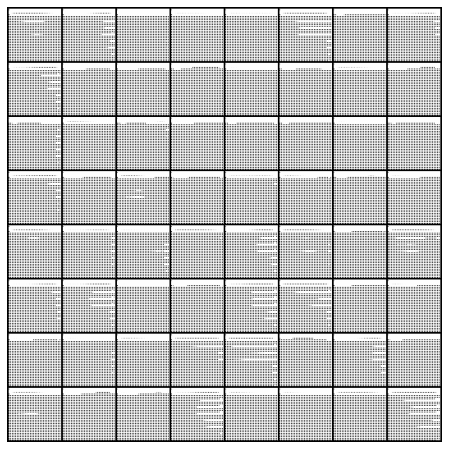

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 1.1899

[1/100][1/21]
- E_loss: 1.2174

[1/100][2/21]
- E_loss: 1.2056

[1/100][3/21]
- E_loss: 1.1512

[1/100][4/21]
- E_loss: 1.1049

[1/100][5/21]
- E_loss: 1.0588

[1/100][6/21]
- E_loss: 1.0128

[1/100][7/21]
- E_loss: 0.9468

[1/100][8/21]
- E_loss: 1.1077

[1/100][9/21]
- E_loss: 1.0058

[1/100][10/21]
- E_loss: 1.0833

[1/100][11/21]
- E_loss: 1.0652

[1/100][12/21]
- E_loss: 1.0006

[1/100][13/21]
- E_loss: 1.0379

[1/100][14/21]
- E_loss: 1.0441

[1/100][15/21]
- E_loss: 1.0710

[1/100][16/21]
- E_loss: 1.0405

[1/100][17/21]
- E_loss: 1.0333

[1/100][18/21]
- E_loss: 1.0802

[1/100][19/21]
- E_loss: 0.9890

[1/100][20/21]
- E_loss: 1.0269

[2/100][0/21]
- E_loss: 0.9900

[2/100][1/21]
- E_loss: 1.0444

[2/100][2/21]
- E_loss: 0.9943

[2/100][3/21]
- E_loss: 0.9773

[2/100][4/21]
- E_loss: 1.0384

[2/100][5/21]
- E_loss: 1.0870

[2/100][6/21]
- E_loss: 1.0243

[2/100][7/21]
- E_loss: 1.0095

[2/100][8/21]
- E_loss: 0.9860

[2/100][9/21]
- E_loss: 1.007

[13/100][0/21]
- E_loss: 0.9924

[13/100][1/21]
- E_loss: 1.0513

[13/100][2/21]
- E_loss: 1.0214

[13/100][3/21]
- E_loss: 0.9979

[13/100][4/21]
- E_loss: 0.9974

[13/100][5/21]
- E_loss: 1.0200

[13/100][6/21]
- E_loss: 0.9888

[13/100][7/21]
- E_loss: 0.9620

[13/100][8/21]
- E_loss: 1.0839

[13/100][9/21]
- E_loss: 1.0770

[13/100][10/21]
- E_loss: 1.0177

[13/100][11/21]
- E_loss: 0.9820

[13/100][12/21]
- E_loss: 1.0296

[13/100][13/21]
- E_loss: 1.1101

[13/100][14/21]
- E_loss: 1.0657

[13/100][15/21]
- E_loss: 1.0956

[13/100][16/21]
- E_loss: 0.9960

[13/100][17/21]
- E_loss: 1.0829

[13/100][18/21]
- E_loss: 1.0221

[13/100][19/21]
- E_loss: 1.0079

[13/100][20/21]
- E_loss: 0.9770

[14/100][0/21]
- E_loss: 1.0434

[14/100][1/21]
- E_loss: 1.0524

[14/100][2/21]
- E_loss: 1.0150

[14/100][3/21]
- E_loss: 1.0430

[14/100][4/21]
- E_loss: 1.0490

[14/100][5/21]
- E_loss: 1.0210

[14/100][6/21]
- E_loss: 0.9406

[14/100][7/21]
- E_loss: 0.9673

[14/100][8/21]
- E_loss: 1.0106


[24/100][15/21]
- E_loss: 1.0689

[24/100][16/21]
- E_loss: 1.0218

[24/100][17/21]
- E_loss: 1.0423

[24/100][18/21]
- E_loss: 0.9961

[24/100][19/21]
- E_loss: 1.0294

[24/100][20/21]
- E_loss: 0.9891

[25/100][0/21]
- E_loss: 0.9739

[25/100][1/21]
- E_loss: 1.0015

[25/100][2/21]
- E_loss: 1.0226

[25/100][3/21]
- E_loss: 1.1012

[25/100][4/21]
- E_loss: 1.0690

[25/100][5/21]
- E_loss: 0.9679

[25/100][6/21]
- E_loss: 1.0500

[25/100][7/21]
- E_loss: 1.0419

[25/100][8/21]
- E_loss: 1.0283

[25/100][9/21]
- E_loss: 1.0201

[25/100][10/21]
- E_loss: 1.0534

[25/100][11/21]
- E_loss: 1.0007

[25/100][12/21]
- E_loss: 0.9873

[25/100][13/21]
- E_loss: 1.0418

[25/100][14/21]
- E_loss: 0.9729

[25/100][15/21]
- E_loss: 1.0655

[25/100][16/21]
- E_loss: 1.0107

[25/100][17/21]
- E_loss: 1.0053

[25/100][18/21]
- E_loss: 1.0315

[25/100][19/21]
- E_loss: 1.0652

[25/100][20/21]
- E_loss: 1.0818

[26/100][0/21]
- E_loss: 1.0985

[26/100][1/21]
- E_loss: 1.0288

[26/100][2/21]
- E_loss: 1

[36/100][9/21]
- E_loss: 0.9784

[36/100][10/21]
- E_loss: 1.0369

[36/100][11/21]
- E_loss: 1.0487

[36/100][12/21]
- E_loss: 0.9715

[36/100][13/21]
- E_loss: 1.0605

[36/100][14/21]
- E_loss: 0.9946

[36/100][15/21]
- E_loss: 0.9619

[36/100][16/21]
- E_loss: 1.0608

[36/100][17/21]
- E_loss: 1.0586

[36/100][18/21]
- E_loss: 1.0867

[36/100][19/21]
- E_loss: 1.0205

[36/100][20/21]
- E_loss: 1.0594

[37/100][0/21]
- E_loss: 1.0528

[37/100][1/21]
- E_loss: 1.0496

[37/100][2/21]
- E_loss: 1.0381

[37/100][3/21]
- E_loss: 1.0391

[37/100][4/21]
- E_loss: 1.0141

[37/100][5/21]
- E_loss: 1.0092

[37/100][6/21]
- E_loss: 0.9940

[37/100][7/21]
- E_loss: 1.0275

[37/100][8/21]
- E_loss: 1.0061

[37/100][9/21]
- E_loss: 0.9820

[37/100][10/21]
- E_loss: 0.9908

[37/100][11/21]
- E_loss: 1.0665

[37/100][12/21]
- E_loss: 1.0384

[37/100][13/21]
- E_loss: 1.0466

[37/100][14/21]
- E_loss: 1.0772

[37/100][15/21]
- E_loss: 1.0450

[37/100][16/21]
- E_loss: 0.9823

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 1.0085

[48/100][4/21]
- E_loss: 0.9864

[48/100][5/21]
- E_loss: 1.0008

[48/100][6/21]
- E_loss: 1.0365

[48/100][7/21]
- E_loss: 1.0877

[48/100][8/21]
- E_loss: 1.0736

[48/100][9/21]
- E_loss: 1.0434

[48/100][10/21]
- E_loss: 0.9923

[48/100][11/21]
- E_loss: 0.9977

[48/100][12/21]
- E_loss: 1.0235

[48/100][13/21]
- E_loss: 0.9819

[48/100][14/21]
- E_loss: 1.0191

[48/100][15/21]
- E_loss: 1.0270

[48/100][16/21]
- E_loss: 1.0641

[48/100][17/21]
- E_loss: 1.0121

[48/100][18/21]
- E_loss: 1.0597

[48/100][19/21]
- E_loss: 1.0691

[48/100][20/21]
- E_loss: 1.0099

[49/100][0/21]
- E_loss: 1.0162

[49/100][1/21]
- E_loss: 1.0376

[49/100][2/21]
- E_loss: 1.0597

[49/100][3/21]
- E_loss: 0.9819

[49/100][4/21]
- E_loss: 1.0075

[49/100][5/21]
- E_loss: 0.9615

[49/100][6/21]
- E_loss: 0.9923

[49/100][7/21]
- E_loss: 0.9919

[49/100][8/21]
- E_loss: 1.0410

[49/100][9/21]
- E_loss: 1.0220

[49/100][10/21]
- E_loss: 1.0316

[49/100][11/21]
- E_loss: 0.981

[59/100][18/21]
- E_loss: 1.0587

[59/100][19/21]
- E_loss: 0.9761

[59/100][20/21]
- E_loss: 0.9965

[60/100][0/21]
- E_loss: 0.9709

[60/100][1/21]
- E_loss: 1.0716

[60/100][2/21]
- E_loss: 1.0171

[60/100][3/21]
- E_loss: 1.0244

[60/100][4/21]
- E_loss: 1.0459

[60/100][5/21]
- E_loss: 1.0271

[60/100][6/21]
- E_loss: 1.0344

[60/100][7/21]
- E_loss: 1.0274

[60/100][8/21]
- E_loss: 1.0159

[60/100][9/21]
- E_loss: 1.0140

[60/100][10/21]
- E_loss: 1.0162

[60/100][11/21]
- E_loss: 1.0241

[60/100][12/21]
- E_loss: 1.0212

[60/100][13/21]
- E_loss: 0.9542

[60/100][14/21]
- E_loss: 1.0115

[60/100][15/21]
- E_loss: 1.0244

[60/100][16/21]
- E_loss: 1.0699

[60/100][17/21]
- E_loss: 1.0479

[60/100][18/21]
- E_loss: 1.0502

[60/100][19/21]
- E_loss: 1.0356

[60/100][20/21]
- E_loss: 1.0079

[61/100][0/21]
- E_loss: 1.0408

[61/100][1/21]
- E_loss: 1.0300

[61/100][2/21]
- E_loss: 1.0790

[61/100][3/21]
- E_loss: 1.0465

[61/100][4/21]
- E_loss: 1.0309

[61/100][5/21]
- E_loss: 0.98

[71/100][12/21]
- E_loss: 0.9918

[71/100][13/21]
- E_loss: 1.0185

[71/100][14/21]
- E_loss: 1.0714

[71/100][15/21]
- E_loss: 1.0655

[71/100][16/21]
- E_loss: 1.0374

[71/100][17/21]
- E_loss: 0.9742

[71/100][18/21]
- E_loss: 0.9795

[71/100][19/21]
- E_loss: 1.0105

[71/100][20/21]
- E_loss: 1.0006

[72/100][0/21]
- E_loss: 1.0397

[72/100][1/21]
- E_loss: 1.0214

[72/100][2/21]
- E_loss: 1.0445

[72/100][3/21]
- E_loss: 0.9805

[72/100][4/21]
- E_loss: 0.9890

[72/100][5/21]
- E_loss: 1.0366

[72/100][6/21]
- E_loss: 1.0296

[72/100][7/21]
- E_loss: 1.0020

[72/100][8/21]
- E_loss: 0.9988

[72/100][9/21]
- E_loss: 1.0513

[72/100][10/21]
- E_loss: 1.0482

[72/100][11/21]
- E_loss: 1.0073

[72/100][12/21]
- E_loss: 1.0343

[72/100][13/21]
- E_loss: 1.0437

[72/100][14/21]
- E_loss: 1.0000

[72/100][15/21]
- E_loss: 1.0226

[72/100][16/21]
- E_loss: 1.0535

[72/100][17/21]
- E_loss: 1.0892

[72/100][18/21]
- E_loss: 1.0338

[72/100][19/21]
- E_loss: 0.9872

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 1.0768

[83/100][7/21]
- E_loss: 1.0443

[83/100][8/21]
- E_loss: 0.9845

[83/100][9/21]
- E_loss: 0.9824

[83/100][10/21]
- E_loss: 1.0113

[83/100][11/21]
- E_loss: 1.0020

[83/100][12/21]
- E_loss: 1.0094

[83/100][13/21]
- E_loss: 0.9899

[83/100][14/21]
- E_loss: 1.0133

[83/100][15/21]
- E_loss: 1.0991

[83/100][16/21]
- E_loss: 1.0730

[83/100][17/21]
- E_loss: 1.0744

[83/100][18/21]
- E_loss: 1.0138

[83/100][19/21]
- E_loss: 0.9726

[83/100][20/21]
- E_loss: 1.0114

[84/100][0/21]
- E_loss: 1.0618

[84/100][1/21]
- E_loss: 1.0269

[84/100][2/21]
- E_loss: 1.0575

[84/100][3/21]
- E_loss: 1.0213

[84/100][4/21]
- E_loss: 0.9994

[84/100][5/21]
- E_loss: 1.0309

[84/100][6/21]
- E_loss: 1.0241

[84/100][7/21]
- E_loss: 1.0436

[84/100][8/21]
- E_loss: 0.9640

[84/100][9/21]
- E_loss: 1.0240

[84/100][10/21]
- E_loss: 1.0245

[84/100][11/21]
- E_loss: 1.0243

[84/100][12/21]
- E_loss: 0.9944

[84/100][13/21]
- E_loss: 1.0128

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.9825

[95/100][1/21]
- E_loss: 0.9932

[95/100][2/21]
- E_loss: 1.0342

[95/100][3/21]
- E_loss: 1.0985

[95/100][4/21]
- E_loss: 1.0182

[95/100][5/21]
- E_loss: 1.0539

[95/100][6/21]
- E_loss: 1.0456

[95/100][7/21]
- E_loss: 1.0439

[95/100][8/21]
- E_loss: 1.0299

[95/100][9/21]
- E_loss: 1.0100

[95/100][10/21]
- E_loss: 1.0345

[95/100][11/21]
- E_loss: 1.0753

[95/100][12/21]
- E_loss: 0.9957

[95/100][13/21]
- E_loss: 0.9581

[95/100][14/21]
- E_loss: 1.0707

[95/100][15/21]
- E_loss: 1.0211

[95/100][16/21]
- E_loss: 1.0199

[95/100][17/21]
- E_loss: 0.9910

[95/100][18/21]
- E_loss: 1.0197

[95/100][19/21]
- E_loss: 1.0020

[95/100][20/21]
- E_loss: 1.0106

[96/100][0/21]
- E_loss: 1.0068

[96/100][1/21]
- E_loss: 1.0092

[96/100][2/21]
- E_loss: 1.0128

[96/100][3/21]
- E_loss: 0.9923

[96/100][4/21]
- E_loss: 1.0339

[96/100][5/21]
- E_loss: 1.0099

[96/100][6/21]
- E_loss: 1.0896

[96/100][7/21]
- E_loss: 1.0040

[96/100][8/21]
- E_loss: 1.0226


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

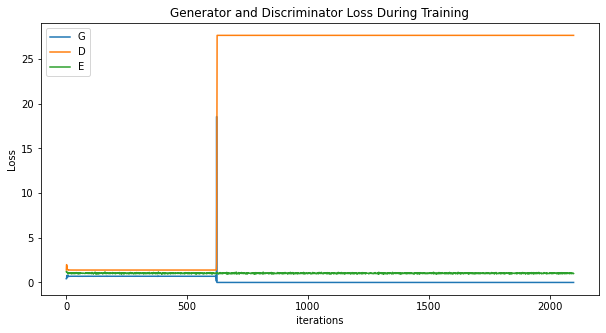

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

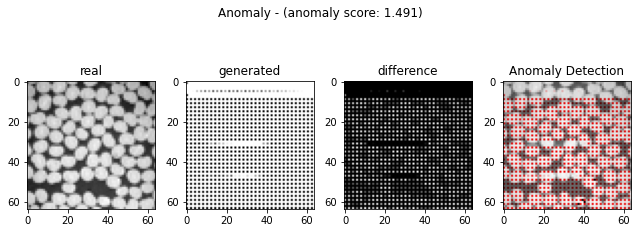

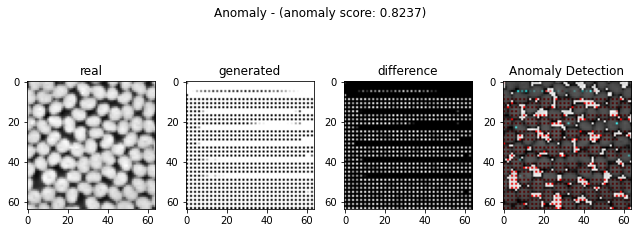

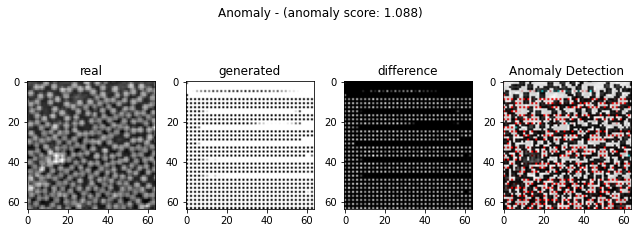

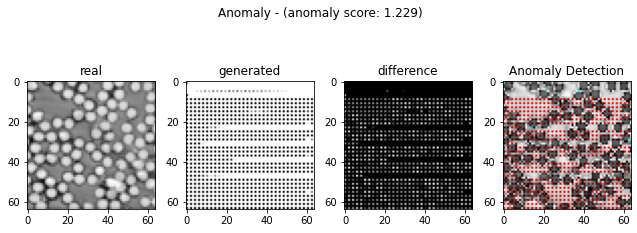

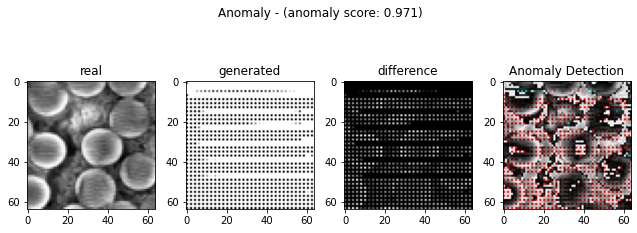

...

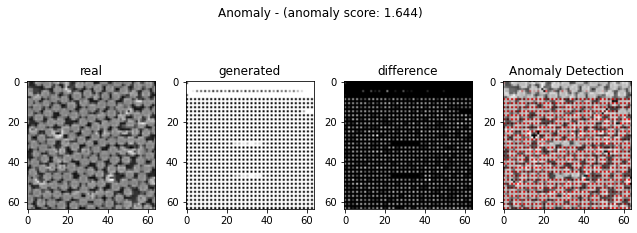

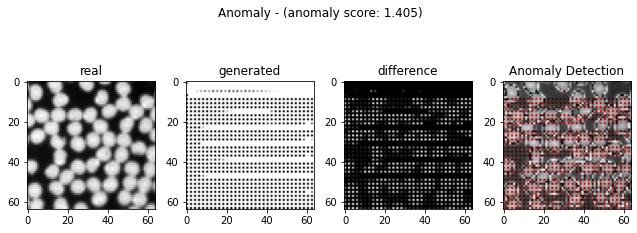

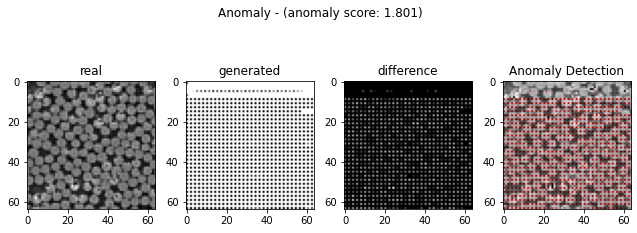

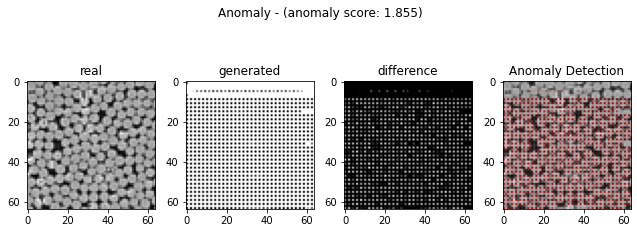

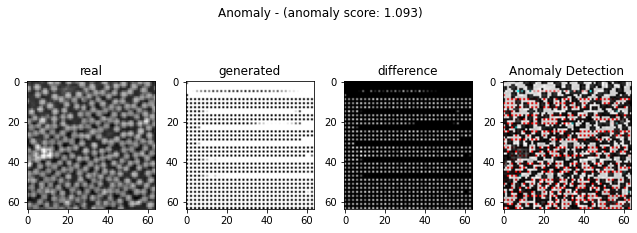

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.21582031 0.18652344 0.18603516 0.19458008 0.18579102 0.2097168
 0.18701172 0.18554688 0.19287109 0.18603516 0.21728516 0.2109375
 0.18798828 0.1862793  0.18579102 0.21337891 0.18652344 0.18774414
 0.21899414 0.18798828 0.20581055 0.21069336 0.18603516 0.21826172
 0.18554688 0.19433594 0.18554688 0.18603516 0.18579102 0.20483398
 0.1862793  0.18603516 0.18579102 0.21411133 0.1875     0.18603516
 0.18676758 0.21484375 0.20483398 0.19604492 0.21923828 0.18603516
 0.21606445 0.21826172 0.19628906 0.1875     0.21801758 0.1875
 0.21801758 0.18579102 0.18823242 0.21875    0.21582031 0.19873047
 0.18554688 0.21777344 0.18920898 0.21972656 0.21875    0.1862793 ]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.19825846354166668

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.007615631001275103, 0.04415624223483376, 0.038475711608662894, 0.010469771055630591, 0.039302970983803684, 0.013313745675150515, 0.04004769569889001, 0.033053661508005115, 0.018732044494399497, 0.04404097382466854, 0.008074457616153566, 0.005013923252744974, 0.025949185379175274, 0.039414628899424306, 0.04397865900978151, 0.015235652278090456, 0.037207656565714724, 0.02524972649206849, 0.01755181660024071, 0.025563931121677673, 0.001989817543366381, 0.00988888150000047, 0.03939334282675749, 0.005653289197498277, 0.04444411670029186, 0.014919035552578012, 0.04530102367083118, 0.04375662119141677, 0.0435709933475044, 0.014097644061827699, 0.03794586929082763, 0.04254409041760793, 0.0409825156972215, 0.01797093165152628, 0.04150909385022875, 0.04237169663294767, 0.0402901484419058, 0.01354517663423473, 0.02410103053521717, -0.019519460819197306, -0.002677346719247931, 0.03714728148336163, 0.011550603439896688, 0.005649339367655064, -0.003242241474845123, 0.041130561085915236, 0.0182077

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

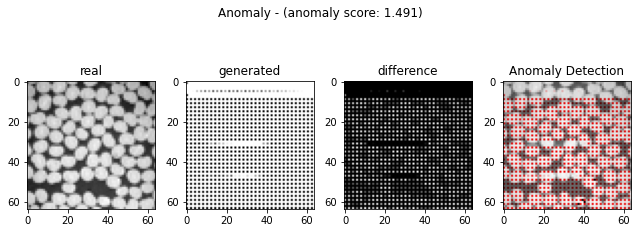

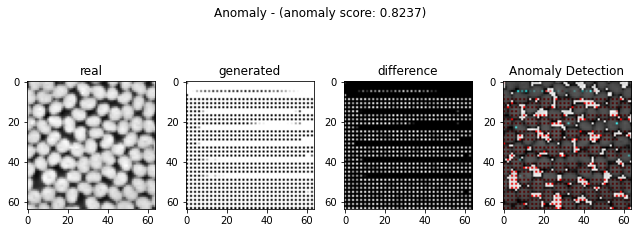

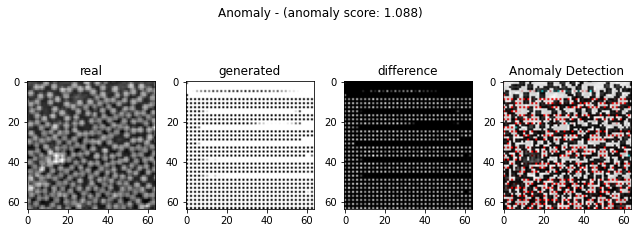

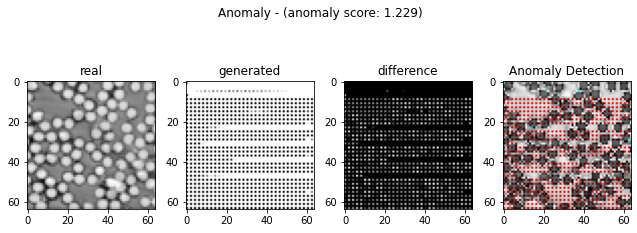

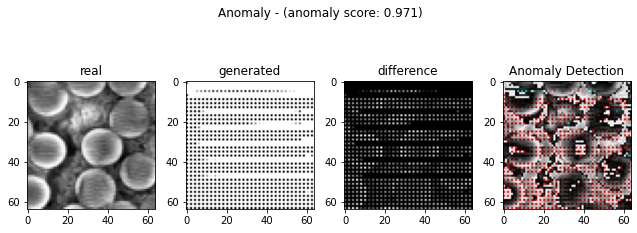

...

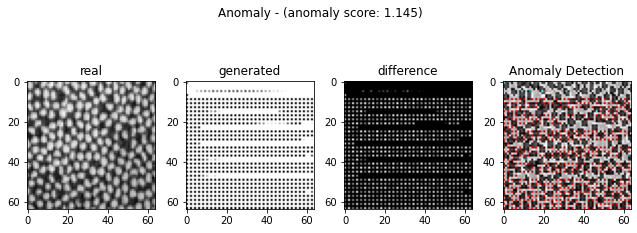

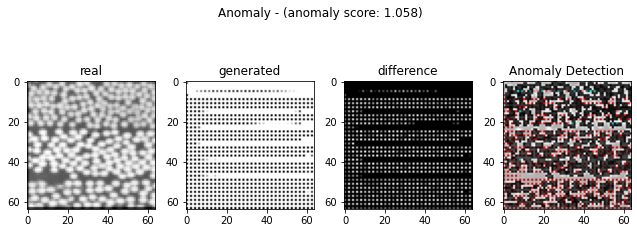

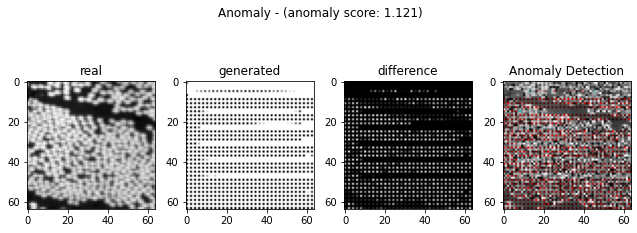

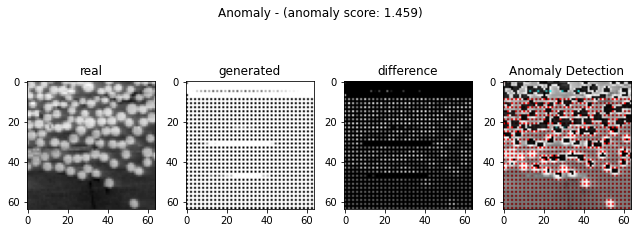

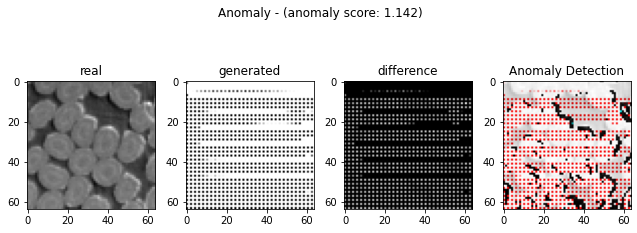

In [ ]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [ ]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

In [ ]:
cal_corr_coeffis()

print(corr_coeffis)

---

# anomaly detection 이미지 추출

In [ ]:
anomaly_imgs

# 이미지 저장 함수

In [ ]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [ ]:
save_imgs("./anomaly_imgs", anomaly_imgs)

---

# 티타늄(Ti64) 상대 밀도 계산

In [ ]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)